In [1]:
import numpy as np
import pandas as pd
from scipy.optimize import minimize
from scipy.stats import norm
import warnings
import matplotlib.pyplot as plt
# from matplotlib import rc
# rc('text', usetex=True)
# rc('xtick', labelsize=20)
# rc('ytick', labelsize=20)

import astropy.units as u
from astropy.timeseries import BoxLeastSquares

import lightkurve
from lightkurve import search_targetpixelfile, search_lightcurve
from astropy.timeseries import LombScargle 

import glob as glob

lightkurve.__version__

'2.0.10'

### Load the Lurie (2017) EB catalog

In [2]:
cat = pd.read_csv("lurie_ebs.csv")
cat = cat[cat['Porb'] < 16]
cat.head()

,KIC,Porb
0,1026032,8.460
2,1161345,8.575
3,1575690,2.252
5,2019076,7.129
6,2162994,4.102


### Define simple transit estimate model composed of two gaussians

In [3]:
def get_data(KIC, porb, window=51, plot=False):
    
    warnings.simplefilter("ignore")
    tpf = search_targetpixelfile(KICID, cadence="long").download(download_dir='data')

    lc_raw = tpf.to_lightcurve(aperture_mask=tpf.pipeline_mask)
    lc_flat = lc_raw.flatten(window_length=window)
    lc_fold = lc_flat.fold(period=porb)
    
    if plot == True:
        lc_raw.plot();
        lc_flat.plot();
        lc_fold.plot();
    
    return lc_raw, lc_flat, lc_fold


def get_arrays(lc):
    
    x = lc.time.value
    y = lc.flux.value
    s = lc.flux_err.value
    
    return x, y, s


def model(theta, x=None):
    
    # Double gaussian transit model
    a1, t1, d1, a2, t2, d2 = theta
    transit1 = a1 * np.exp(-0.5 * (x - t1)**2 / d1**2) 
    transit2 = a2 * np.exp(-0.5 * (x - t2)**2 / d2**2) 
    
    return 1 - transit1 - transit2


def chisq(theta, x=None, y=None, s=None):
    
    # chi^2 between model and data
    ypred = model(theta, x=x)
    chi2 = 0.5 * np.sum((y - ypred)**2/s**2)
    
    # req positive stdev
    if (theta[2] < 0) or (theta[5] < 0):
        return np.inf
    
    # req postive amplitude
    if (theta[0] < 0) or (theta[3] < 0):
        return np.inf
    
    # req secondary not w/in duration of primary
    if (theta[1]-theta[2] < theta[4] < theta[1]+theta[2]):
        return np.inf
    
    return chi2


def init_optimizer(x, y, dur_est=.1):
    
    t0 = np.zeros(6)

    # estimate gaussian parameters for primary
    pri_ind = np.argmin(y)
    
    t0[0] = 1 - y[pri_ind]
    t0[1] = x[pri_ind]
    t0[2] = dur_est
    
    # estimate gaussian parameters for secondary
    pri_mask = np.where((x < x[pri_ind]-.25) | (x > x[pri_ind]+.25))[0]
    sec_ind = np.argmin(y[pri_mask])
    
    t0[3] = 1 - y[pri_mask][sec_ind]
    t0[4] = x[pri_mask][sec_ind]
    t0[5] = dur_est
    
    return t0


def est_duration(theta, bound=1e-3):
    
    # Estimate duration by diff of these gaussian percentiles
    perc = [bound, 1-bound]
    
    dmin1 = norm.ppf(perc[0], loc=theta[1], scale=theta[2])
    dmax1 = norm.ppf(perc[1], loc=theta[1], scale=theta[2])
    duration1 = dmax1 - dmin1
    
    dmin2 = norm.ppf(perc[0], loc=theta[4], scale=theta[5])
    dmax2 = norm.ppf(perc[1], loc=theta[4], scale=theta[5])
    duration2 = dmax2 - dmin2
    
    return duration1, duration2


def fit_model(x, y, s):
    
    t0 = init_optimizer(x, y, dur_est=.05)

    warnings.simplefilter("ignore")
    res = minimize(chisq, t0, method='powell', args=(x, y, s))
    
    return t0, res.x, res.fun


def fit_best_window(KICID, porb):

    windows = np.arange(10,120,10)+1

    cfit = []
    for w in windows:
        lc_raw, lc_flat, lc_fold = get_data(KICID, porb, window=w)
        x, y, s = get_arrays(lc_fold)
        t0, sol, chi_fit = fit_model(x, y, s)
        cfit.append(chi_fit)
        
    wbest = windows[np.argmin(cfit)]

    lc_raw, lc_flat, lc_fold = get_data(KICID, porb, window=wbest)
    x, y, s = get_arrays(lc_fold)
    t0, sol, chi_fit = fit_model(x, y, s)
    
    return t0, sol, chi_fit, wbest, lc_raw, lc_flat, lc_fold


def apply_transit_mask(x, y, sol):
    
    bls = BoxLeastSquares(x*u.day, y, dy=None)

    dur = max(dur1, dur2)
    tmask1 = bls.transit_mask(x, porb, dur, min(x)+sol[1])
    tmask2 = bls.transit_mask(x, porb, dur, min(x)+sol[4])
    tmask = tmask1 | tmask2
    rmask = ~tmask
    
    return tmask, rmask


def plot_best_fit(KICID, t0, sol, chi_fit, wbest, lc_raw, lc_flat, lc_fold, show=False):
    
    fig, ax = plt.subplots(4,1, figsize=[16,30])

    # Plot raw light curve
    traw, fraw = lc_raw.time.value, lc_raw.flux.value
    ax[0].plot(traw, fraw, color='k')
    ax[0].set_xlim(min(traw), max(traw))

    # Plot flattened light curve
    tflat, fflat = lc_flat.time.value, lc_flat.flux.value
    ax[1].plot(tflat, fflat, color='k', label=f"window={wbest}")
    ax[1].set_xlim(min(tflat), max(tflat))
    ax[1].legend(loc='best', fontsize=22, frameon=False)

    # Plot folded light curve and best model fit
    tfold, ffold = lc_fold.time.value, lc_fold.flux.value
    dur1, dur2 = est_duration(sol, bound=1e-3)
    pname = [r"$a_1$", r"$t_1$", r"$\sigma_1$", r"$a_2$", r"$t_2$", r"$\sigma_2$"]
    label = ''
    for ii in range(len(pname)):
        label += f"{pname[ii]}={np.round(sol[ii],3)}\n"
    label += r"$\chi^2=%s$"%(int(np.round(chi_fit)))

    ax[2].scatter(tfold, ffold, color='k', s=3)
    ax[2].plot(tfold, model(t0, x=tfold), color='b')
    ax[2].plot(tfold, model(sol, x=tfold), color='r', label=label)
    ax[2].axvline(sol[1], linestyle='--')
    ax[2].axvline(sol[4], linestyle='--')
    ax[2].axvspan(sol[1]-dur1/2, sol[1]+dur1/2, alpha=.1)
    ax[2].axvspan(sol[4]-dur2/2, sol[4]+dur2/2, alpha=.1)
    ax[2].set_xlim(min(tfold), max(tfold))
    ax[2].legend(loc='best', fontsize=22, frameon=False)

    # Plot transit mask
    tmask, rmask = apply_transit_mask(traw, fraw, sol)
    ax[3].scatter(traw[tmask], fraw[tmask], s=3, color='k')
    ax[3].scatter(traw[rmask], fraw[rmask], s=3, color='r')
    ax[3].set_xlim(min(traw), max(traw))

    ax[0].set_title(KICID, fontsize=25)
    plt.tight_layout()
    if show == True:
        plt.show()
    plt.close()
    
    return fig

### Fit best model and plot

In [4]:
idx = 6
ID = list(cat['KIC'])[idx]
porb = list(cat['Porb'])[idx]
KICID = f"KIC {ID}"
print(porb)
print(KICID)

t0, sol, chi_fit, wbest, lc_raw, lc_flat, lc_fold = fit_best_window(KICID, porb)
dur1, dur2 = est_duration(sol, bound=1e-3)
print(dur1, dur2)

1.362
KIC 2305543
0.14898354867647032 0.15367044454568002


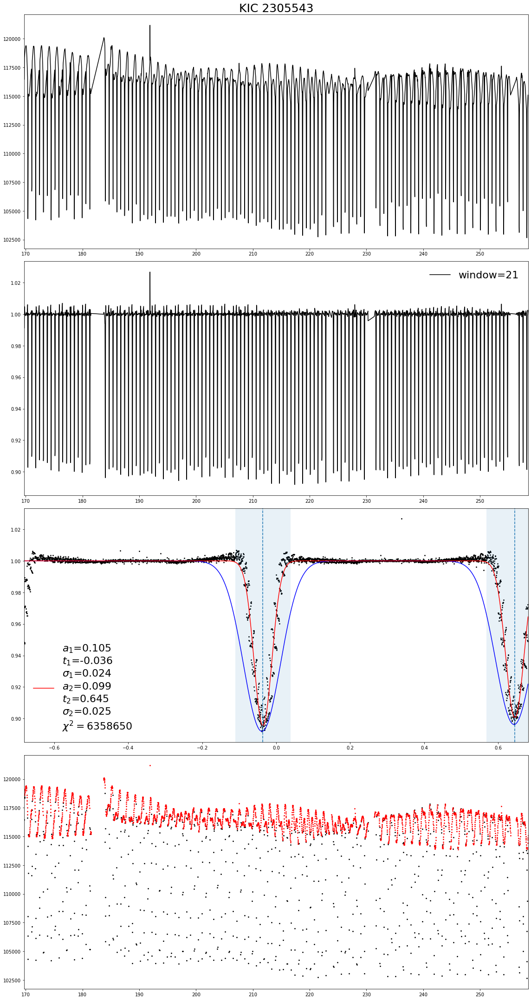

In [5]:
fig = plot_best_fit(KICID, t0, sol, chi_fit, wbest, lc_raw, lc_flat, lc_fold, show=True)
fig.savefig(f'plots/{KICID}.png')

In [6]:
def find_ecc(t1, t2, d1, d2, porb):
    t_minus_t = np.abs(t2-t1)
    ecos = 0.5 * np.pi * (t_minus_t/porb - 0.5)
    
    d_over_d = d2/d1
    esin = (d_over_d - 1) / (d_over_d + 1)
    
    e2 = ecos**2 + esin**2
    
    return np.sqrt(e2)

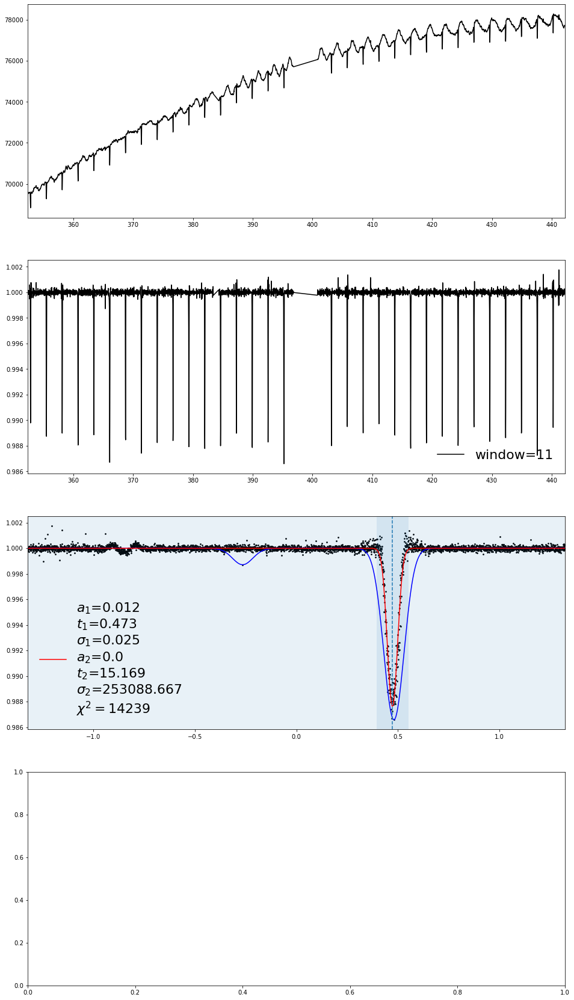

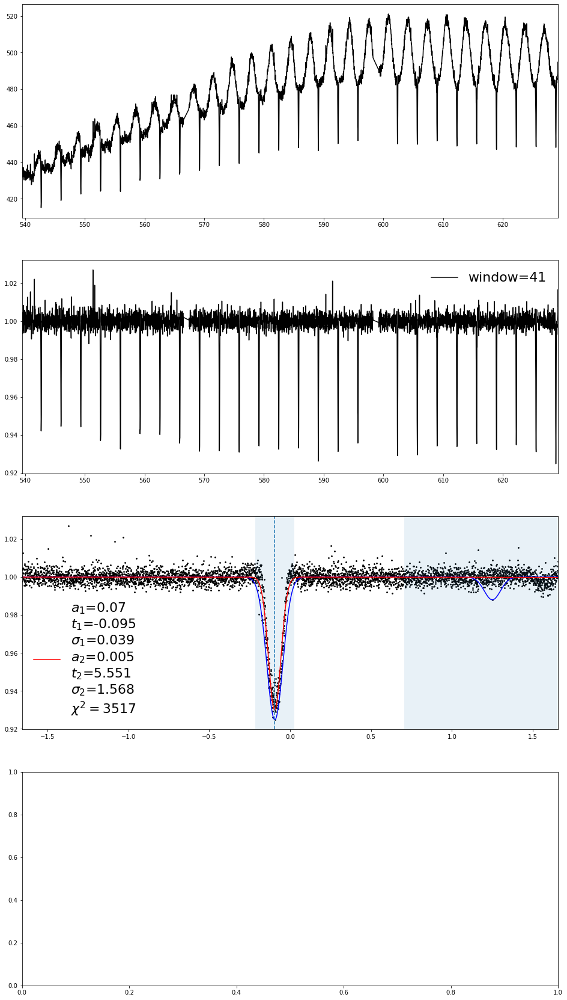

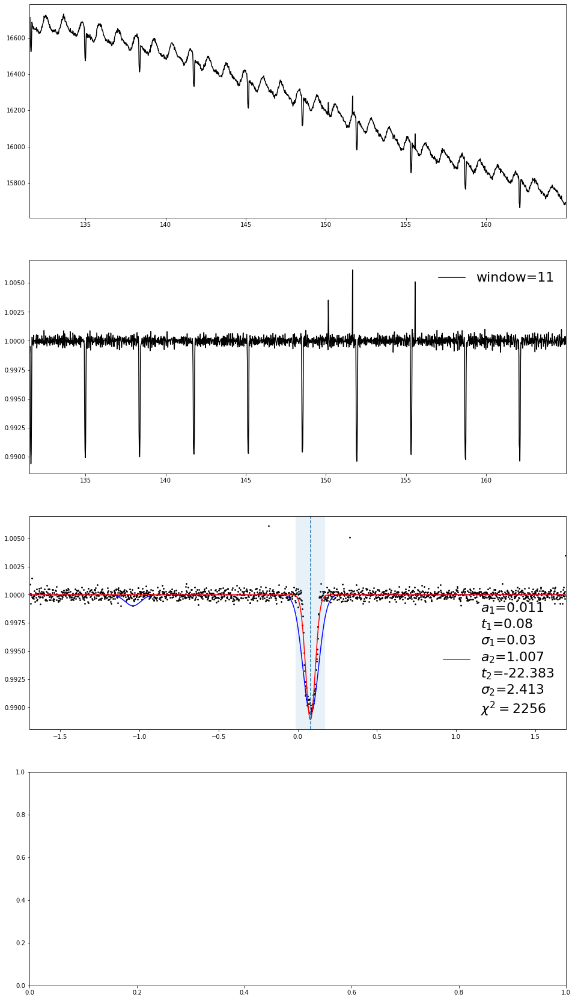

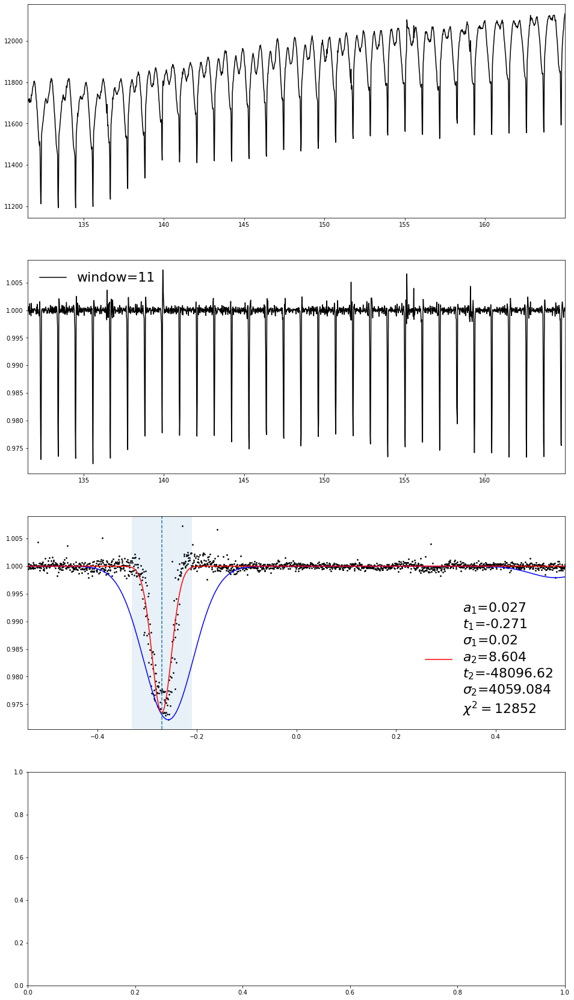

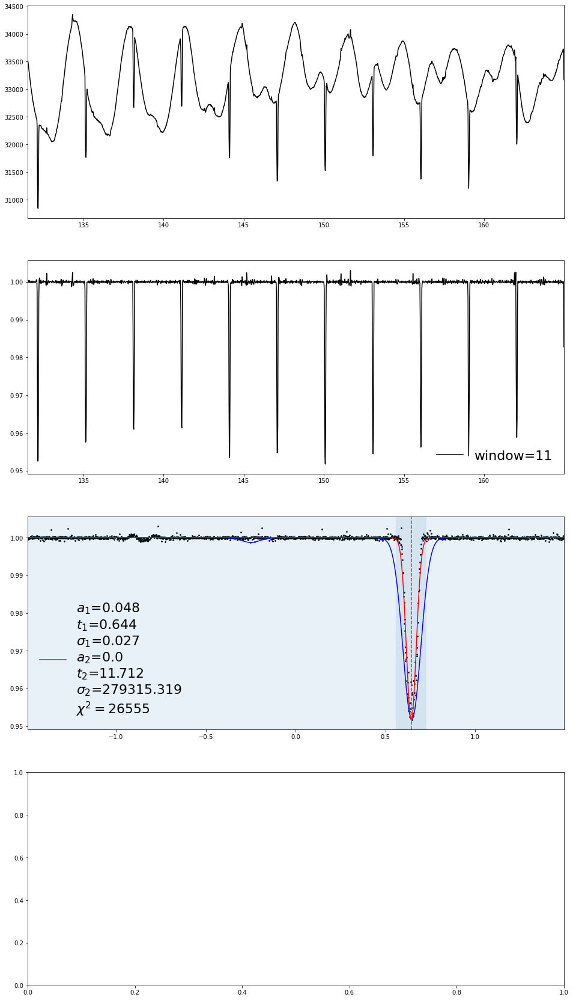

...

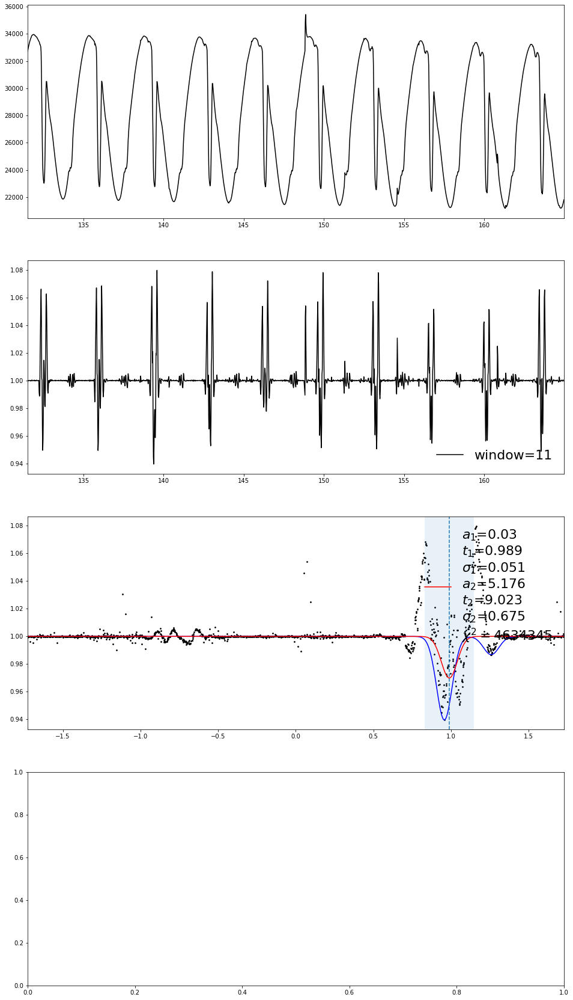

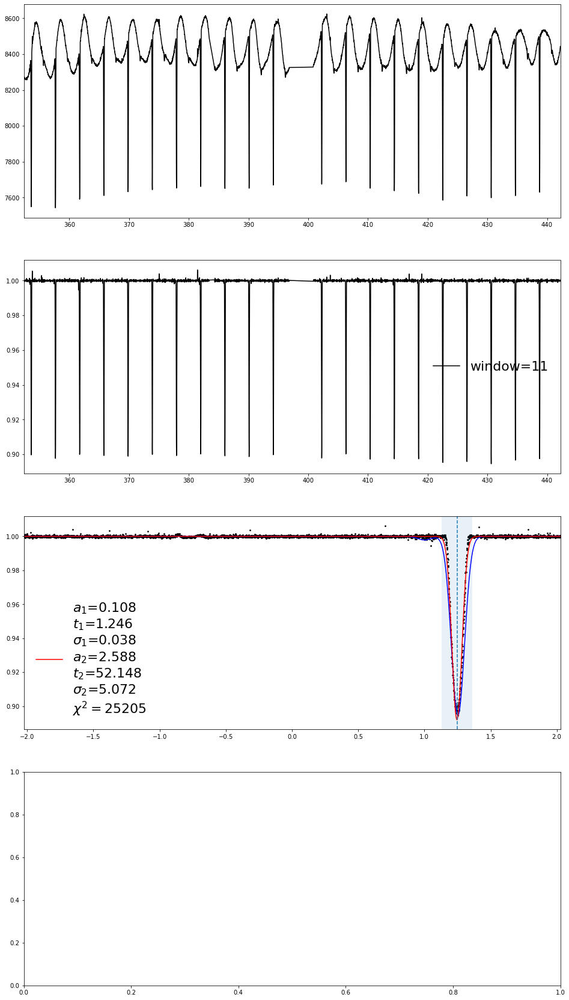

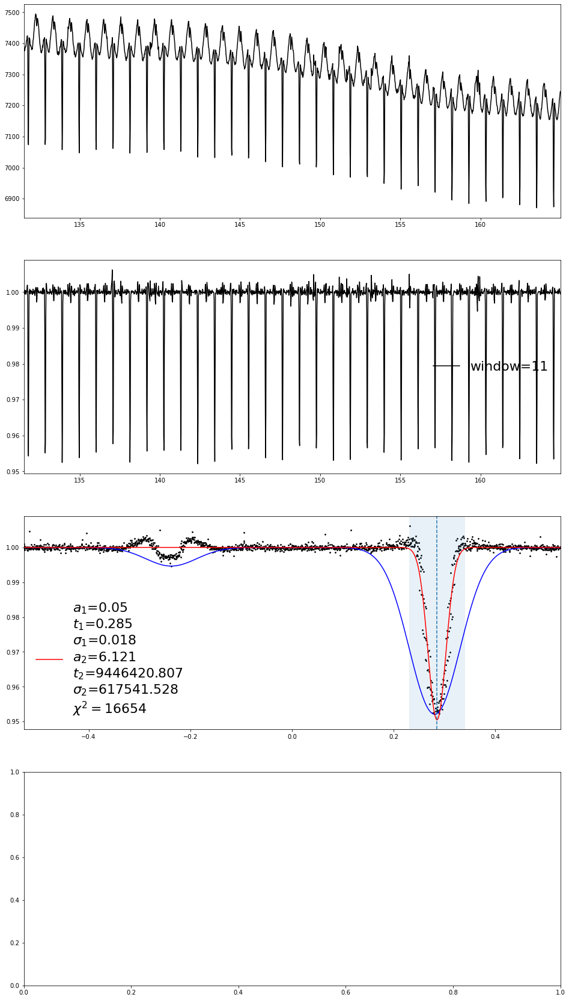

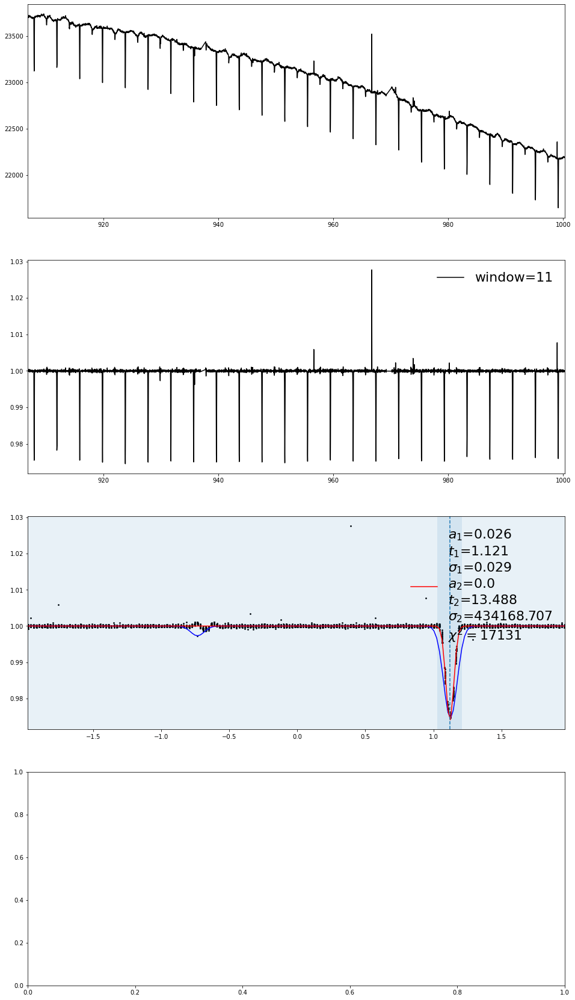

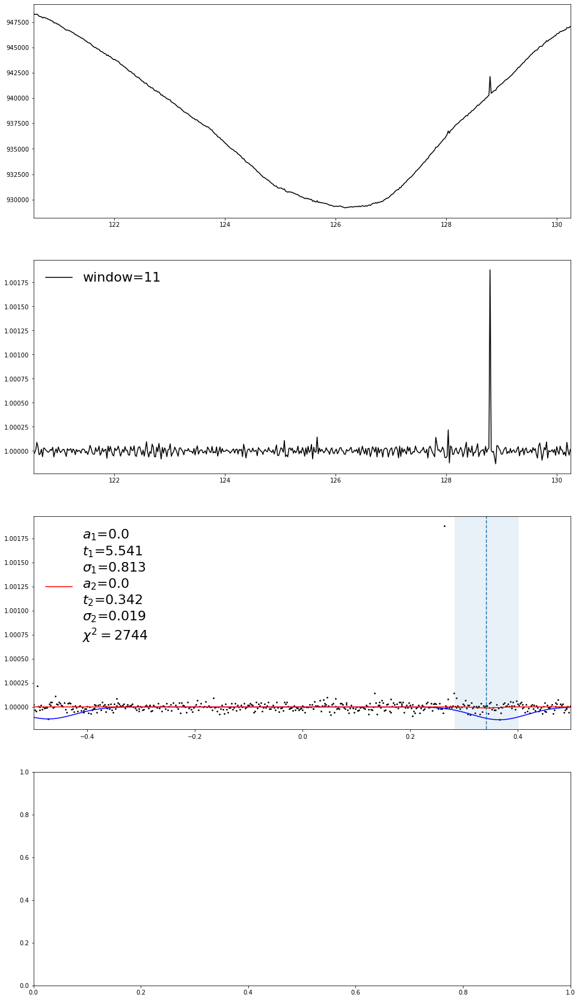

In [7]:
sample = {'KIC': [], 'Porb': [], 'sol': [], 'chi_fit': [], 'window': [],
          'dur1': [], 'dur2': [], 'ecc' : []}

plot_files = glob.glob('./plots/*.png')

for idx in range(len(cat)):
    KIC = list(cat['KIC'])[idx]
    KICID = f"KIC {KIC}"
    porb = list(cat['Porb'])[idx]
    
    try:
        t0, sol, chi_fit, wbest, lc_raw, lc_flat, lc_fold = fit_best_window(KICID, porb)
        dur1, dur2 = est_duration(sol, bound=1e-3)
        ecc = find_ecc(sol[1], sol[4], sol[2], sol[5], porb)

        fig = plot_best_fit(KICID, t0, sol, chi_fit, wbest, lc_raw, lc_flat, lc_fold, show=False)
        file_name = f'plots/{KICID}.png'
        if file_name not in plot_files:
            fig.savefig(f'plots/{KICID}.png')

        sample['KIC'].append(list(cat['KIC'])[idx])
        sample['Porb'].append(porb)
        sample['sol'].append(sol)
        sample['chi_fit'].append(chi_fit)
        sample['window'].append(wbest)
        sample['dur1'].append(dur1)
        sample['dur2'].append(dur2)
        sample['ecc'].append(ecc)
        
        traw, fraw = lc_raw.time.value, lc_raw.flux.value
        tmask, rmask = apply_transit_mask(traw, fraw, sol)    
        np.save(f'./masks/KIC_{KIC}_tmask', tmask)
        np.save(f'./masks/KIC_{KIC}_rmask', rmask)
        

    except:
        sample['KIC'].append(list(cat['KIC'])[idx])
        sample['Porb'].append(porb)
        sample['sol'].append([])
        sample['chi_fit'].append(np.nan)
        sample['window'].append(np.nan)
        sample['dur1'].append(np.nan)
        sample['dur2'].append(np.nan)
        sample['ecc'].append(np.nan)

In [8]:
table = pd.DataFrame(data=sample)
table.to_csv('transit_table.csv', index=False)

In [9]:
errors = table[table['chi_fit'].isna()]
errors = errors[['KIC', 'Porb']]
errors.to_csv('error_table.csv', index=False)

In [11]:
good_files = glob.glob('./plots/sorted/good/*.png')
good = []
for n in range(len(good_files)):
    kic = good_files[n][24:-4]
    good.append(int(kic))

In [12]:
bad_files = glob.glob('./plots/sorted/bad/*.png')
bad = []
for n in range(len(bad_files)):
    kic = bad_files[n][23:-4]
    bad.append(int(kic))

In [13]:
edge_files = glob.glob('./plots/sorted/edge_issues/*.png')
edge = []
for n in range(len(edge_files)):
    kic = edge_files[n][31:-4]
    edge.append(int(kic))

In [14]:
good_table = transit_table[transit_table['KIC'].isin(good)]
good_table.to_csv('good_table.csv', index=False)

In [15]:
bad_table = transit_table[transit_table['KIC'].isin(bad)]
bad_table.to_csv('bad_table.csv', index=False)

In [16]:
edge_table = transit_table[transit_table['KIC'].isin(edge)]
edge_table.to_csv('edge_table.csv', index=False)